In [1]:
import pandas as pd
import plotly.express as px
import numpy as np

In [2]:
df_main = pd.read_json('./data/main/tmdb_data_main.json')
df_main.columns

Index(['tmdb_id', 'movie', 'overview', 'popularity', 'release_date',
       'vote_average', 'budget', 'revenue', 'genres', 'reviews', 'keywords',
       'production_companies', 'production_countries', 'release_year',
       'poster_path', 'tagline'],
      dtype='object')

In [3]:
df_main.shape

(19663, 14)

# Viz Helper Functions
---

In [38]:
def plotly_streamlit_layout(fig,height,width):
    
    fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)',
                      barmode='stack',
                      width=width,
                      height=height,
                        )

    fig.update_layout(margin=dict(l=50,r=50,b=50,t=150,pad=2))
    
    return fig

def plotly_streamlit_texts(fig,title,x_title,y_title):

    fig.update_layout(yaxis=dict(title=y_title,titlefont_size=10,tickfont_size=10),
                      xaxis=dict(title=x_title,titlefont_size=10,tickfont_size=10))
    
    return fig

In [4]:
def unpack_dictionary(df,cast_crew,pop_mask=6):
    
    col = cast_crew+'_as_list'
    
    cc = mask_popularity(df,'cast',pop_mask)
    
    df[col] = df[cast_crew].apply(lambda x: process_dic(cc, x,'name'))
    
    return df

In [5]:
def mask_popularity(df, cast_crew, pop_mask):
    all_dic = [x for i in df[cast_crew] for x in i]
    out = [(dic['name'],dic['popularity']) for dic in all_dic]
   
    df_results = pd.DataFrame(out)
    df_results.drop_duplicates(subset=0,inplace=True)
    df_results.columns = [cast_crew, 'popularity']

    if pop_mask:
        return df_results[df_results['popularity'] >= pop_mask].sort_values(by='popularity',ascending=False)
    else:
        return df_results.sort_values(by='popularity',ascending=False)

In [6]:
def process_dic(df, x,key):
    out = []
    for dic in x:
        if dic[key] in df.cast.to_list():
            out.append(dic[key])
        else:
            pass
    return list(set(out))

# Colour Palettes
---

In [6]:
light = 'rgb(131,199,161)'
med = 'rgb(6,180,226)'
dark = 'rgb(3,37,65)'

# Exploratory Analysis
---

 - Highest Grossing Films (across period, in year)
 - Higest Budget Films (across period, in year)
 - Most profitable Films (across period, in year)
 - Busiest Actors (across period, in year)


 - Most common genres over time
 - Most common genres by actor
    

- most common production countries over time
 - most common production countries by actor
 - which actor is most travelled
    
    
ACTOR DEEPDIVE
- What films have a specific actor been in?
- When were they most active



#### Highest Grossing Films, Highest Budget Films, Most Profitable

In [11]:
plotly_streamlit_texts(plotly_streamlit_layout(
                        px.bar(df_main.sort_values(by='revenue',ascending=True),x='revenue',y='movie',orientation='h'),
                        height=1000,width=2000),title='f',x_title='g',y_title='h')

# Genres and Titles (Sunburst)
---

In [30]:
genre_period = df_main.explode('genres').dropna(subset=['genres'])
genre_period = genre_period[genre_period.vote_average > 0]
genre_period_fig = px.treemap(genre_period, path=[px.Constant("Films"), 'genres', 'movie'], values='revenue',
                     color='vote_average',
                     color_continuous_scale='YlGnBu')
genre_period_fig.update_layout(width=1600,height=650,
                                    margin=dict(t=50, l=25, r=25, b=25))

ZeroDivisionError: Weights sum to zero, can't be normalized

# Most Common Genres Trended
---

In [42]:
from datetime import datetime
def year_converter(year_string):
    return pd.to_datetime(datetime.strptime(str(year_string), "%Y"))
    

In [43]:
results = []
df_main_edit = df_main[df_main.release_year >= 1960]
for i in df_main_edit.release_year.unique():
    df_mask = pd.DataFrame(df_main_edit[df_main_edit.release_year == i].explode('genres')['genres'].value_counts())
    df_mask.columns = [i]
    results.append(df_mask)
genre_count = pd.concat(results,axis=1).fillna(0)

In [51]:
genre_count_sum = genre_count[genre_count.columns.sort_values()].T
# genre_count_sum = genre_count_sum.reset_index()
# genre_count.index = genre_count.index.map(lambda x: year_converter(x))
genre_count_sum = genre_count_sum.rolling(4).mean()
genre_count_sum

,Comedy,Drama,Horror,Action,Thriller,Adventure,Crime,Science Fiction,Romance,Fantasy,Mystery,Family,War,History,Animation,Music,Western,TV Movie,Documentary
1960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1963,7.75,20.25,5.00,4.25,5.50,5.00,4.50,2.25,6.25,1.50,2.00,1.25,3.00,4.50,0.25,0.25,3.50,0.00,0.00
1964,9.00,21.00,4.50,4.75,5.00,5.00,4.25,2.00,7.50,1.50,2.75,1.25,3.25,4.00,0.50,0.75,3.00,0.25,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,299.00,426.25,134.50,191.00,218.75,110.75,90.25,95.50,139.00,80.25,70.50,85.50,24.00,39.50,100.00,30.25,8.00,42.25,50.75
2018,328.00,457.75,145.75,198.25,234.50,116.50,100.25,103.50,148.50,88.25,77.75,88.50,25.75,49.00,99.00,36.25,8.25,50.00,55.50
2019,343.00,469.75,152.50,204.00,252.00,117.25,110.25,98.00,148.50,93.50,82.25,92.25,28.25,52.75,101.25,36.00,8.25,49.50,60.75
2020,337.25,433.50,156.00,186.25,240.75,109.75,108.00,91.50,140.25,96.50,77.25,97.00,25.50,50.25,100.00,39.00,7.25,44.00,69.00


In [53]:
import plotly.graph_objects as go

x=genre_count_sum.index

fig = go.Figure()

for i in range(len(genre_count_sum.columns)):
    fig.add_trace(go.Scatter(
        x=x, y=genre_count_sum[genre_count_sum.columns[i]],
        hoverinfo='x+y',
        mode='lines',
        line=dict(width=0.5, color='rgb(131, 90, 241)'),
        stackgroup='one' # define stack group
    ))
# fig.add_trace(go.Scatter(
#     x=x, y=[20, 10, 10, 60],
#     hoverinfo='x+y',
#     mode='lines',
#     line=dict(width=0.5, color='rgb(111, 231, 219)'),
#     stackgroup='one'
# ))
# fig.add_trace(go.Scatter(
#     x=x, y=[40, 30, 50, 30],
#     hoverinfo='x+y',
#     mode='lines',
#     line=dict(width=0.5, color='rgb(184, 247, 212)'),
#     stackgroup='one'
# ))

fig.update_layout(yaxis_range=(0, 2500))
fig.show()

# Actor Deepdive
---

### New JSON Formatting Functions

In [3]:
import swifter

ModuleNotFoundError: No module named 'swifter'

In [3]:
%%time
def get_person_data_new(path):
    with open(path) as f:
        lines = f.read().splitlines()
    df_inter = pd.DataFrame(lines)
    df_inter.columns = ['json_element']
    df = pd.json_normalize(df_inter['json_element'].apply(json.loads))
    df = df.rename(columns={'popularity':'popularity_actor','name':'actor'})
    return df


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 6.2 µs


In [4]:
def get_actor_frame(df_actor_all, actor):
    return df_actor_all[df_actor_all.actor == actor]


def get_actor_image(df_actor_specific_frame):
    root_img_path = 'https://image.tmdb.org/t/p/w500'
    url = root_img_path + df_actor_specific_frame.profile_path.unique()[0]
    # response = requests.get(url)
    # img = Image.open(BytesIO(response.content))
    return url

In [5]:
%%time
import json
cast = get_person_data_new('./data/cast_crew_new/cast_3.jsonl')
cast = cast[cast.adult == False]

cast = cast[['tmdb_id','actor','popularity_actor','profile_path','character']]


CPU times: user 1.55 s, sys: 102 ms, total: 1.65 s
Wall time: 1.65 s


In [6]:
df_actor_all = pd.merge(cast,df_main,left_on='tmdb_id',right_on='tmdb_id',how='left')

## Genres Known For
---

In [96]:
x = list(set(df_actor_all.actor.values))

In [97]:
x.sort()
list(x).index('Tom Hanks')

3266

In [63]:
df_actor_specific_frame = get_actor_frame(df_actor_all, 'Aaron Eckhart')


In [16]:
genres_in = pd.DataFrame(df_actor_specific_frame.explode('genres')['genres'].value_counts())
genres_in

,genres
Drama,22
Thriller,17
Action,10
Crime,8
Comedy,7
Mystery,5
Romance,5
Horror,3
Adventure,3
Science Fiction,3


In [18]:
genres_in_pie = go.Figure(data=[go.Pie(labels=genres_in.index, values=genres_in['genres'], textinfo='label+percent',
                     insidetextorientation='radial', hole=0.3,)])
genres_in_pie.update_layout(width=700,height=500,showlegend=True)
genres_in_pie.update_traces(marker=dict(colors=px.colors.qualitative.D3))
# genres_in_pie.update_traces(texttemplate='%{percent:0%f}')

## Filmography Timeline
---

In [7]:
df_actor_specific_frame = get_actor_frame(df_actor_all, 'Sean Bean')
df_actor_specific_frame = df_actor_specific_frame[df_actor_specific_frame.revenue > 0]
df_actor_specific_frame.shape

(27, 18)

In [9]:
df_filmography = df_actor_specific_frame.copy()
df_filmography['release_date'] = df_filmography['release_date'].apply(lambda x: str(x))
df_filmography['character_year'] = df_filmography['character'] + ' | ' + df_filmography['release_date']
order = df_filmography.sort_values(by='release_date')['movie'].values
px.bar(df_filmography,x='movie',y='popularity',category_orders={'movie':order},text='character_year',color='popularity')

# Word Clouds

In [147]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [148]:
def get_actor_image(df_actor_specific_frame):
    root_img_path = 'https://image.tmdb.org/t/p/w500'
    url = root_img_path + df_actor_specific_frame.profile_path.unique()[0]
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    return img,url

In [149]:
sl_path = '/Users/sam.ho/Documents/sam_personal/streamlit_apps/imdb_network_analysis/assets/fonts/IBMPlexSans-Regular.ttf'

In [210]:

mask = np.array(get_actor_image(df_actor_specific_frame)[0])
wordcloud = WordCloud(font_path=sl_path,background_color="white",contour_color='black',prefer_horizontal=True,
                      stopwords=STOPWORDS, mode="RGBA", max_words=2000, mask=mask).generate_from_text(str(df_actor_specific_frame.overview))
image_colors = ImageColorGenerator(mask)

wordcloud.recolor(color_func=image_colors)




In [192]:
def actor_word_cloud(image,texts):
    mask = np.array(image)
    wordcloud = WordCloud(font_path=sl_path,background_color="white",contour_color='black',prefer_horizontal=True,
                          stopwords=STOPWORDS, mode="RGBA", max_words=2000, mask=mask).generate_from_text(texts)
    image_colors = ImageColorGenerator(mask)
    plt.figure(figsize=[17,17])
    plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear")
    plt.axis("off")
#     plt.show()
    return plt

In [151]:
def get_keywords(df_actor_specific_frame):
    strings = []
    for movie in df_actor_specific_frame['keywords']:
        try:
            for keyword in movie:
                try:
                    strings.append(keyword['name'])
                except:
                    pass
        except:
            pass
    return ' '.join(strings)

In [165]:
x.Figure

matplotlib.figure.Figure

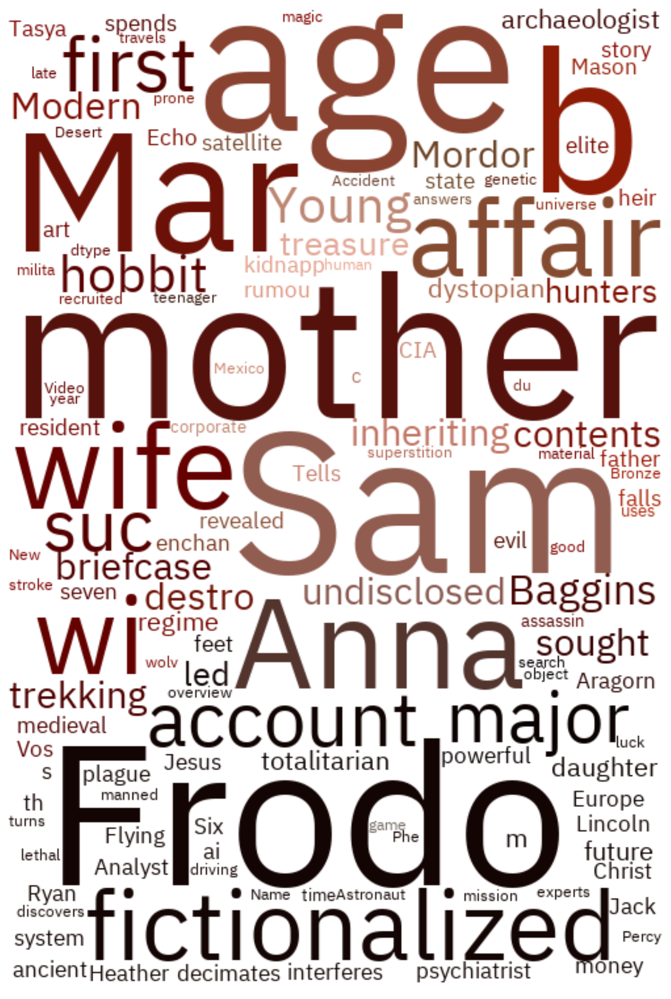

In [160]:
x = actor_word_cloud(get_actor_image(df_actor_specific_frame)[0],str(df_actor_specific_frame.overview))

# Reviews
---

In [78]:
def get_data_from_dic(df_actor_specific_frame,col,key,string_return = True):
    strings = []
    for movie in df_actor_specific_frame[col]:
        try:
            for keyword in movie:
                try:
                    strings.append(keyword[key])
                except:
                    pass
        except:
            pass
        
    if string_return:
        return ' '.join(strings)
    else: 
        return [' '.join(i.split()) for i in strings]

In [81]:
df_actor_specific_frame.reviews[4160]

[{'author': 'Gimly',
  'author_details': {'name': 'Gimly',
   'username': 'Ruuz',
   'avatar_path': '/xUObnJSvHrFPsIpoDmb1jiQZLq7.jpg',
   'rating': 5.0},
  'content': "Maybe the real National Treasure was this movie we watched along the way.\r\n\r\nOkay so I didn't **love** _National Treasure_, but it 100% is what it's supposed to be. I never watched it as a kid, this was literally the first time I've ever seen more than about 5 minutes of it, so I don't have the nostalgia thing that a lot of people do, but I do think I'll watch it again. And, even though I didn't much like the sequel, I think I'd still definitely try out a 3rd _National Treasure_ if it ever got made.\r\n\r\n_Final rating:★★½ - Had a lot that appealed to me, didn’t quite work as a whole._",
  'created_at': '2020-06-19T14:28:23.267Z',
  'id': '5eeccb8759e8a90037c82126',
  'updated_at': '2020-06-24T01:16:09.844Z',
  'url': 'https://www.themoviedb.org/review/5eeccb8759e8a90037c82126'},
 {'author': 'JPV852',
  'author_det

In [79]:
get_data_from_dic(df_actor_specific_frame,'reviews','content',string_return=False)

['Brooking no argument, history should quickly regard Peter Jackson’s The Fellowship Of The Ring as the first instalment of the best fantasy epic in motion picture history. This statement is worthy of investigation for several reasons. Fellowship is indeed merely an opening salvo, and even after three hours in the dark you will likely exit the cinema ravenous with anticipation for the further two parts of the trilogy. Fellowship is also unabashedly rooted in the fantasy genre. Not to be confused with the techno-cool of good science fiction, nor even the cutesy charm of family fare like Harry Potter, the territory of Tolkien is clearly marked by goo and goblins and gobbledegook. Persons with an aversion to lines such as, “To the bridge of Khazad-dûm!” are as well to stay within the Shire-like comforts of home (their loss). With those caveats in place, it bears repeating: fantasy does not come finer. There are electrifying moments — notably the computer-assisted swooping camera through I

# CO-Occurrence - Actors
---

In [7]:
import sys
import os
sys.path.append(os.getenv('SAM_PATH'))

In [8]:
from samutil import NetworkGeneration

In [9]:
def actor_popularity_mask(df,pop_mask=5):
    return df[df.popularity_actor >= pop_mask]

def movie_mask(df,col,mask):
    df = df.explode(col)
    df = df[df[col].isin(mask)]
    return df.movie

In [10]:
def get_co_occurrence_frame(df,df_actor,pop_mask=None,genre_mask=[],actor_mask=[]):
    
    
    if pop_mask:
        df_actor = actor_popularity_mask(df_actor,pop_mask=pop_mask)
    
    actor_grouped = pd.DataFrame(df_actor.groupby('movie')['actor'].agg(lambda x: x.to_list()))
    
    cols_use = ['movie','popularity','release_date','release_year','vote_average','budget','revenue','genres']
    df = df[cols_use].set_index('movie')
    
    df_co = pd.merge(df,actor_grouped,left_index=True,right_index=True,how='right').reset_index()
    
    if genre_mask:
        films_in_genre = movie_mask(df_co,col='genres',mask=genre_mask)
        df_co = df_co[df_co.movie.isin(films_in_genre)]
        
    if actor_mask:    
        films_in_genre = movie_mask(df_co,col='actor',mask=actor_mask)
        df_co = df_co[df_co.movie.isin(films_in_genre)]
        
        
    return df_co



In [62]:
%%time
def get_graph(df_main,df_actor_all,actor_mask =None, year_threshold = None):
    df = get_co_occurrence_frame(df_main,df_actor_all,actor_mask = actor_mask,pop_mask=10)
    if year_threshold:
        df = df[df.release_year >= year_threshold]
    net = NetworkGeneration(df['actor'].dropna())
    net.fit_transform()
    return net

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.72 µs


In [64]:
net = get_graph(df_main,df_actor_all,actor_mask=['Tom Hanks'],year_threshold=2000)

Getting edges and nodes..
Building graph..
Getting graph features..
Updating DataFrames..


# Graph Stats
---

## Tables

Actors that are unconnected

In [13]:
def get_no_edges_popularity(graph):
    df = pd.DataFrame(graph.no_edge_df.groupby('source')['target'].agg(lambda x: x.to_list()))
    df['no_edge_count'] = df['target'].apply(lambda x: len(x))
    return df

Actors that are connected

In [14]:


def get_edges_popularity(graph,cast):
    first_merge = pd.merge(graph.edge_df,cast[['actor','popularity_actor']],left_on='source',right_on='actor',how='left')
    second_merge = pd.merge(first_merge,cast[['actor','popularity_actor']],left_on='target',right_on='actor',how='left')
    second_merge = second_merge.drop(columns = ['actor_x','actor_y'])
    second_merge = second_merge.rename(columns={'popularity_actor_x':'source_popularity','popularity_actor_y':'target_popularity'})
    second_merge = second_merge.drop_duplicates(subset=['source','target'])
    second_merge['node_plot'] = second_merge['source']+' & '+second_merge['target']
    return second_merge

In [15]:
df_edges = get_edges_popularity(net,cast)
df_edges = df_edges.sort_values(by=['source'],ascending=False)

In [16]:
test = [1]*df_edges.shape[0]

In [17]:
df_edges

,source,target,edge_frequency,source_code,target_code,source_popularity,target_popularity,node_plot
328218,Willem Dafoe,Zoe Saldana,2,70,62,12.509,10.446,Willem Dafoe & Zoe Saldana
77949,Vin Diesel,Zoe Saldana,4,74,62,35.914,10.446,Vin Diesel & Zoe Saldana
127644,Tom Hiddleston,Vin Diesel,3,83,74,22.407,35.914,Tom Hiddleston & Vin Diesel
462978,Tom Hiddleston,Zoe Saldana,2,83,62,22.407,10.446,Tom Hiddleston & Zoe Saldana
470749,Tom Hardy,Willem Dafoe,2,23,70,23.448,12.509,Tom Hardy & Willem Dafoe
...,...,...,...,...,...,...,...,...
1363779,Alexandra Daddario,Owen Wilson,1,64,67,18.770,15.088,Alexandra Daddario & Owen Wilson
463792,Alexandra Daddario,Dwayne Johnson,2,64,93,18.770,35.635,Alexandra Daddario & Dwayne Johnson
1292263,Alexandra Daddario,Henry Cavill,1,64,7,18.770,22.658,Alexandra Daddario & Henry Cavill
606415,Alexandra Daddario,Sebastian Stan,1,64,82,18.770,15.927,Alexandra Daddario & Sebastian Stan


In [18]:
fig = px.scatter(df_edges,x='target',y='source',size='edge_frequency',hover_name='node_plot',color='edge_frequency',color_continuous_scale='YlGnBu')
plotly_streamlit_texts(plotly_streamlit_layout(fig,height=1600,width=1600),title=None,x_title=None,y_title=None)

NameError: name 'plotly_streamlit_texts' is not defined

## Which Films star people together
---


In [54]:
import requests
from PIL import Image
from io import BytesIO

In [55]:
ac_1_mask = df_actor_all.actor == 'Tom Cruise'
ac_2_mask = df_actor_all.actor == 'Simon Pegg'

results = np.intersect1d(df_actor_all[ac_1_mask].movie.unique(),df_actor_all[ac_2_mask].movie.unique())

In [56]:
def get_poster(poster_url):
    response = requests.get(poster_url)
    img = Image.open(BytesIO(response.content))
    return img

In [57]:
poster_urls = df_actor_all[df_actor_all.movie.isin(results)].drop_duplicates(subset=['movie']).sort_values(by='release_date')
poster_urls = poster_urls['poster_path'].values

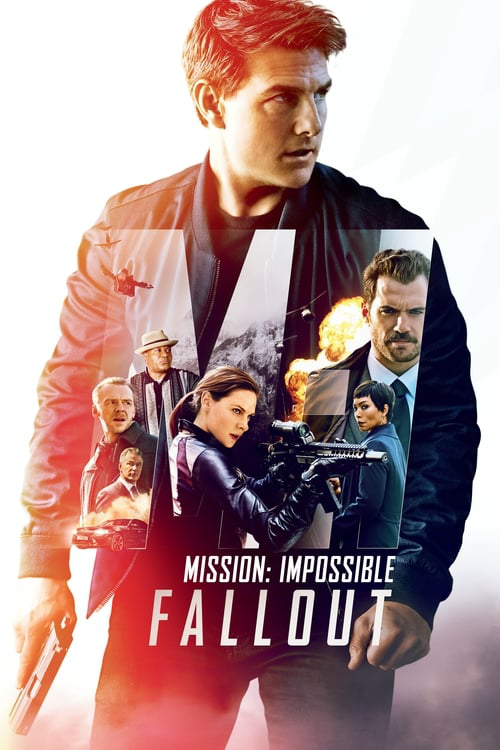

In [61]:
get_poster(poster_urls[3])

# Plot Network
---

#### Tools 

In [71]:
def merge_actor_popularity(graph_model,cast_df):
    cast_df = cast_df.drop_duplicates(subset='actor',keep='first')
    cast_df = cast_df.rename(columns={'actor':'id'})
    node_df_update = pd.merge(net.node_df,cast_df[['id','popularity_actor']],left_on='id',right_on='id',how='left')
    return node_df_update
    

In [72]:
merge_actor_popularity(net.node_df,cast)

,id,id_code,adjacency_frequency,betweeness_centrality,clustering_coefficient,community,popularity_actor
0,Margot Robbie,0,11,0.002896,0.272727,0,22.278
1,Rose Byrne,1,20,0.010423,0.268421,1,13.971
2,Jackie Chan,2,6,0.005550,0.200000,3,15.431
3,Ryan Reynolds,3,19,0.007129,0.391813,1,40.989
4,Mads Mikkelsen,4,9,0.002589,0.194444,2,10.411
...,...,...,...,...,...,...,...
110,Willem Dafoe,110,26,0.018730,0.273846,1,12.509
111,Ben Affleck,111,24,0.016444,0.293478,0,14.901
112,Ruby Rose,112,5,0.000481,0.300000,2,10.776
113,Kate Winslet,113,13,0.005431,0.166667,1,10.445


In [65]:
import networkx as nx
import plotly.graph_objects as go

In [66]:
%%time
# extract graph x,y co-ordinates from G instance
pos = nx.kamada_kawai_layout(net.G,dim=2)



CPU times: user 16.3 ms, sys: 1.85 ms, total: 18.1 ms
Wall time: 16.6 ms


In [67]:
%%time
#add position of each node from G to 'pos' key

for node in net.G.nodes:
    net.G.nodes[node]['pos'] = list(pos[node])

CPU times: user 65 µs, sys: 1 µs, total: 66 µs
Wall time: 68.9 µs


In [68]:
%%time
#add edges to Plotly go.Scatter object

graph_stack = []
index = 0
for edge in net.G.edges:

    x0, y0,  = net.G.nodes[edge[0]]['pos']
    x1, y1,  = net.G.nodes[edge[1]]['pos']
    weight = 0.2

    trace = go.Scatter(x=tuple([x0, x1, None]), y=tuple([y0, y1, None]), 
                       mode='lines',
                       line={'width': weight},
                       marker=dict(color='lightgrey'),
                       line_shape='spline',
                       opacity=1)

    #append edge traces
    graph_stack.append(trace)

    index = index + 1

CPU times: user 26.4 ms, sys: 3.28 ms, total: 29.7 ms
Wall time: 39.5 ms


In [69]:
%%time
#conditionals for either showing a plot where formatting denotes community or not
# if community_plot == True:

#     #make a partly empty dictionary for the nodes
#     marker = {'size':[],'line':dict(width=0.5,color=edge_col),'color':[]}



#make a partly empty dictionary for the nodes
marker = {'colorscale':'Viridis','size':[],'line':dict(width=0.5,color='#ece8e8'),'color':[],'colorbar':dict(thickness=15,
                                                                                   title='Node Connections',
                                                                                   xanchor='left',
                                                                                   titleside='right')}


#initialise a go.Scatter object for the nodes
node_trace = go.Scatter(x=[], y=[], hovertext=[], text=[], mode='markers', textposition="bottom center",
                        hoverinfo="text", marker=marker)


CPU times: user 6.2 ms, sys: 5.36 ms, total: 11.6 ms
Wall time: 30.4 ms


In [70]:
%%time
index = 0

#add nodes to Plotly go.Scatter object
for node in net.G.nodes():

    x, y = net.G.nodes[node]['pos']

    node_trace['x'] += tuple([x])

    node_trace['y'] += tuple([y])
    
#     node_trace['z'] += tuple([z])

    node_trace['text'] += tuple([net.node_df['id'][index]])

#     if community_plot == True:

#         node_trace['marker']['color'] += tuple(list(net.node_df.community))

#         node_trace['marker']['size'] += tuple([list(plot_df[node_size])[index]])

# else:

    node_trace['marker']['color'] += tuple([list(net.node_df.adjacency_frequency)[index]])
#     node_trace['marker']['size'] += tuple([5] *229)
    node_trace['marker']['size'] += tuple([list(net.node_df.adjacency_frequency)[index]])

    index = index + 1
 #append node traces
graph_stack.append(node_trace)

CPU times: user 12.3 ms, sys: 219 µs, total: 12.6 ms
Wall time: 12.4 ms


In [71]:
%%time
#set up axis for plot
axis=dict(showline=False, # hide axis line, grid, ticklabels and  title
          zeroline=False,
          showgrid=False,
          showticklabels=False,
          title='')

#set up figure for plot
figure = {"data": graph_stack,"layout":go.Layout(title='vv',
                                            font= dict(family='Arial',size=20),
                                            width=1100,
                                            height=1100,
                                            autosize=False,
                                            showlegend=False,
                                            xaxis=axis,
                                            yaxis=axis,
                                            margin=dict(l=40,r=40,b=85,t=100,pad=0),
                                            hovermode='closest',
                                            plot_bgcolor='white')}

# #retain plot figure as attribute
# self.graph_plot = figure



CPU times: user 1.85 ms, sys: 13 µs, total: 1.87 ms
Wall time: 1.87 ms


In [72]:
%%time
fig = go.Figure(figure)
fig.show()

CPU times: user 57.9 ms, sys: 10 ms, total: 67.9 ms
Wall time: 65.8 ms


In [32]:
def plotGraph(self,sizing=75,node_size='adjacency_frequency',layout=nx.kamada_kawai_layout,light_theme=True,colorscale='Viridis',community_plot=False):

#     #formatting options for plot - dark vs. light theme
#     if light_theme:
#         back_col = '#ffffff'
#         edge_col = '#ece8e8'

#     else:
#         back_col = '#000000'
#         edge_col = '#2d2b2b'

#     """
#     normalise all graph metrics
#     """
#     #subset graph metrics
#     X = self.node_df[self.node_df.columns[2:5]]

#     #get columns labels
#     cols = self.node_df.columns[2:5]

#     #instantiate instance of MinMaxScaler class
#     min_max_scaler = preprocessing.MinMaxScaler()

#     #transform graph metrics
#     X_scaled = min_max_scaler.fit_transform(X)

#     #create new dataframe of scaled metrics
#     plot_df = pd.DataFrame(X_scaled)

#     plot_df.columns=cols

#     for i in plot_df.columns:
#         plot_df[i] = plot_df[i].apply(lambda x: x*sizing)


    #extract graph x,y co-ordinates from G instance
    pos = layout(self.G)

    #add position of each node from G to 'pos' key
    for node in self.G.nodes:
        self.G.nodes[node]['pos'] = list(pos[node])



    stack = []

    index = 0

    #add edges to Plotly go.Scatter object
    for edge in self.G.edges:

        x0, y0 = self.G.nodes[edge[0]]['pos']

        x1, y1 = self.G.nodes[edge[1]]['pos']

        weight = 0.5

        trace = go.Scatter(x=tuple([x0, x1, None]), y=tuple([y0, y1, None]),
                           mode='lines',
                           line={'width': weight},
                           marker=dict(color=edge_col),
                           line_shape='spline',
                           opacity=1)

        #append edge traces
        stack.append(trace)

        index = index + 1

    #conditionals for either showing a plot where formatting denotes community or not
    if community_plot == True:

        #make a partly empty dictionary for the nodes
        marker = {'size':[],'line':dict(width=0.5,color=edge_col),'color':[]}

    else:

        #make a partly empty dictionary for the nodes
        marker = {'colorscale':colorscale,'size':[],'line':dict(width=0.5,color=edge_col),'color':[],'colorbar':dict(thickness=15,
                                                                                           title='Node Connections',
                                                                                           xanchor='left',
                                                                                           titleside='right')}


    #initialise a go.Scatter object for the nodes
    node_trace = go.Scatter(x=[], y=[], hovertext=[], text=[], mode='markers', textposition="bottom center",
                            hoverinfo="text", marker=marker)

    index = 0

    #add nodes to Plotly go.Scatter object
    for node in self.G.nodes():

        x, y = self.G.nodes[node]['pos']

        node_trace['x'] += tuple([x])

        node_trace['y'] += tuple([y])

        node_trace['text'] += tuple([self.node_df['id'][index]])

        if community_plot == True:

            node_trace['marker']['color'] += tuple(list(self.node_df.community))

            node_trace['marker']['size'] += tuple([list(plot_df[node_size])[index]])

        else:

            node_trace['marker']['color'] += tuple([list(self.node_df.adjacency_frequency)[index]])

            node_trace['marker']['size'] += tuple([list(self.node_df.adjacency_frequency)[index]])

        index = index + 1

    #append node traces
    stack.append(node_trace)


    #set up axis for plot
    axis=dict(showline=False, # hide axis line, grid, ticklabels and  title
              zeroline=False,
              showgrid=False,
              showticklabels=False,
              title=''
              )

    #set up figure for plot
    figure = {
    "data": stack,
    "layout":
    go.Layout(title=str(self.source[0]+' is..'),
                font= dict(family='Arial',size=20),
                width=1100,
                height=1100,
                autosize=False,
                showlegend=False,
                xaxis=axis,
                yaxis=axis,
                margin=dict(
                l=40,
                r=40,
                b=85,
                t=100,
                pad=0,

        ),
        hovermode='closest',
        plot_bgcolor=back_col, #set background color
        )}

    #retain plot figure as attribute
    self.graph_plot = figure

    #plot the figure
    iplot(self.graph_plot)

    return

#sunburst that plots communities and relevant hahstags
def plotCommunity(self,colorscale=False):

    #make copy of node dataframe
    df_temp = self.node_df.copy()

    #change community label to string (needed for plot)
    df_temp['community'] = df_temp['community'].map(lambda x: str(x))

    #conditionals for plot type
    if colorscale == False:

        fig = px.sunburst(df_temp, path=['community', 'id'], values='adjacency_frequency',color='community',hover_name=None,
                      hover_data=None)
    else:
        fig = px.sunburst(df_temp, path=['community', 'id'], values='adjacency_frequency',
                      color='betweeness_centrality', hover_data=None,
                      color_continuous_scale='blugrn',
                      color_continuous_midpoint=np.average(df_temp['betweeness_centrality'], weights=df_temp['betweeness_centrality']))

    #add margin to plot
    fig.update_layout(margin = dict(t=0, l=0, r=0, b=0))

    #retain community plot as attribute
    self.community_plot = fig

    #offline sunburst plot
    iplot(self.community_plot)

    return

In [360]:
import itertools
import networkx as nx

In [361]:
net = NetworkGeneration(x['actor'])

In [362]:
net.fit_transform()

Getting edges and nodes..
Building graph..


In [364]:
net.edge_df

,source,target,edge_frequency,source_code,target_code
0,Quentin Tarantino,Steve Buscemi,10,592,273
1,Mark Strong,William Hurt,9,95,443
2,Stephen Amell,Sung Kang,8,585,422
3,Jordana Brewster,Vin Diesel,7,215,454
4,Russell Crowe,Uma Thurman,7,127,652
...,...,...,...,...,...
6912,Jeff Bridges,Pedro Pascal,1,82,281
6913,Jeff Bridges,Martyn Ford,1,82,356
6914,Jeff Bridges,Mark Strong,1,82,95
6915,Jeff Bridges,Julianne Moore,1,82,93


## Taglines

In [83]:
df_tag = df_actor_all[['movie','genres','tagline']].drop_duplicates(subset=['tagline'],keep='first')

In [84]:
df_tag = df_tag.explode('genres').drop_duplicates(subset=['tagline'],keep='first')

In [88]:
df_tag = df_tag.replace("", np.nan)
df_tag

AttributeError: 'NoneType' object has no attribute 'replace'